# QUICHE

#### <font color=red>This notebook is almost exactly copied from the QUICHE GitHub (https://github.com/jranek/quiche/tree/main), with some tweaks and annotations for applying it to IMC. It will require a fair amount of tweaking for your dataset. You will need to follow their intruction for setting up the environment, and read the accompnanying preprint paper (https://www.biorxiv.org/content/10.1101/2025.01.06.631548v1)</font>

### How does this differ from 'neighbourhood identification' approaches?
Tradtional (which are still relatively new, but the field moves quickly!) neighbourhoo idenfication approaches aim to identify conserved patterns of cellular interaction/localisation that are usually called cellular neighbourhoods. There are several approaches published that work well (eg. CellCharter), and they usually use some sort of spatial clustering or moving average over the tissue to identify the neighbourhoods. In the papers where they publish these approaches, they usually show that the approach nicely captures established tissue features – e.g. different histological zones where we know a priori that there are different organisation of cells. However, it’s less clear what these approaches are actually telling you in a tissue with less clear organisation – they will always find *some* sort of cellular neighbourhoods, but without some way of validating them (in the previous example, with reference to histological zones or prior knowledge of cellular organisation in the tissue), then it’s hard to be certain they are biologically meaningful. In such situations, people usually correlate the cellular neighbourhoods with disease outcomes, confirming that they are biologically meaningful.

QUICHE approaches the problem slightly differently, which is a little bit harder to get your head around. It switches the order of operations by first doing the differential expression analysis between your groups. Usually, this would require us to have defined clusters/neighbourhoods somehow, but QUICHE does the differential expression analysis on the k-nearest neighbour graphs using Milo (https://pubmed.ncbi.nlm.nih.gov/34594043/). Once the regions that are differential expressed between your groups are established, QUICHE then gives them names. However, this is where the Milo approach causes us problems, because we don’t strictly have clusters or neighbourhoods to work with. QUICHE gives several options for how to then name/group the neighbourhoods. The method I have used, which is the recommended one, is to name them based upon the top 3 cell populations present, with populations having to be at least 5% of the cells in the region to be considered. QUICHE considers a cell and its 30 neighbours, so if it was 29 of 1 population A and only 1 of population B, it would be called ‘PopulationA’. If it was 15 of PopulationA and 15 of PopulationB, it would be called ‘PopulationA_PopulationB’. As you will see, the result is that QUICHE generates a lot more neigbourhoods than 'tradtional' neighbourhood id aporoaches, many of which seem fairly similar. However, by the very nature of QUICHE, we know that these neighbourhoods (or 'niches' as QUICHE calls them, but it means the same thing - recurring patterns of populations localising together) are differentially expressed between our conditions. Currently, I've only tried it with two groups, but there may be a way to set up the differential expression part so that we can have multiple groups. Overall, by focusing only on neighbourhoods/niches which are differentially expressed between our conditions/treatments/groups, we can then focus our efforts on these areas of the tissue which are biologically meaningful.



# Imports

In [23]:
import os
import pandas as pd
import numpy as np
import quiche as qu
import scanpy as sc
import anndata
import seaborn as sb
import networkx as nx
%reload_ext autoreload
%load_ext autoreload
%autoreload 2
%matplotlib inline

sc.set_figure_params(dpi = 200, dpi_save = 200, fontsize = 10)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Load in data

<font color='red'>I remove cases where we have no survival info, and assigned remaining cases to long vs short suvival based upon the median survival. We just need a way of dividing our cells into two groups. These groups don't have to go with complete ROIs, you could compare regions within patients.</font>

In [2]:
adata = anndata.read_h5ad('adata_pixie_SMA_subs_pixie_final.h5ad')

# Remove cases with no outcome measures
adata = adata[~adata.obs.Case.isin(['N1207', 'N403', 'N540', 'N935'])]

# This removes any cases with less than this number of cells
sketch_size = 1000
adata  = qu.pp.filter_fovs(adata, 'Case', sketch_size)

# Rename population cell cluster due to error in QUICHE code - 'population_final' was the population column in my AnnData.obs.
# There is currently an error in the code so that we need to rename it to 'cell_cluster'
adata.obs.rename(columns={'population_final':'cell_cluster'}, inplace=True)

# Here I calculate median survival, indicating them by either Short or Long
median_survival_time = adata.obs.groupby('Case').mean(numeric_only=True)['Survival_diagnosis'].median()

adata.obs['Survival'] = np.where(adata.obs['Survival_diagnosis'] > median_survival_time, 'Long', 'Short')
adata.obs['Survival'] = adata.obs['Survival'].astype('str')

# initialize class

In [3]:
qu.tl.QUICHE?

Init signature:
qu.tl.QUICHE(
    adata: anndata._core.anndata.AnnData,
    labels_key: str = 'cell_cluster',
    spatial_key: str = 'spatial',
    fov_key: str = 'fov',
    patient_key: str = 'Patient_ID',
    segmentation_label_key: str = 'label',
    verbose: Union[int, bool] = 1,
    **kwargs,
)
Docstring:     
Performs spatial enrichment analysis using QUICHE
    
Init docstring:
Initializes the QUICHE object.

Parameters
----------
adata: anndata.AnnData
    annotated data object containing preprocessed single-cell data
labels_key: str (default = 'cell_cluster')
    column in adata.obs containing cell phenotype information
spatial_key: str (default = 'spatial')
    key in adata.obsm containing cell centroid coordinates
fov_key: str (default = 'fov')
    column in adata.obs with field of view information
patient_key: str (default = 'Patient_ID')
    column in adata.obs with patient-level identifiers
segmentation_label_key: str (default = 'label')
    column in adata.obs with segme

In [4]:
## initialize class
quiche_op = qu.tl.QUICHE(adata = adata, 
                         labels_key = 'cell_cluster', 
                         spatial_key = 'spatial', 
                         fov_key = 'ROI', 
                         patient_key = 'Case', 
                         segmentation_label_key = 'ObjectNumber'
                        )

INFO:quiche.tools.quiche:Converted 'ROI' to categorical.


# step 1: compute spatial niches 

In [5]:
quiche_op.compute_spatial_niches?

Signature:
quiche_op.compute_spatial_niches(
    radius: int = 200,
    p: int = 2,
    n_neighbors: Optional[int] = None,
    khop: Optional[int] = None,
    min_cell_threshold: int = 3,
    coord_type: str = 'generic',
    delaunay: bool = False,
    n_jobs: int = -1,
)
Docstring:
Computes spatial spatial niches according to spatial neighbors.

Parameters
----------
radius: int (default = 200)
    radius in pixels for bounding local niche detection
p: int (default = 2)
    integer referring to distance metric. 1 = manhattan distance, 2 = Euclidean distance
n_neighbors: int or None (default = None)
    number of nearest neighbors for spatial proximity detection
khop: int or None (default = None)
    number of hops for local niche detection
min_cell_threshold: int (default = 3)
    minimum number of neighbors for a niche cell type vector to be considered
coord_type: str (default = 'generic')
    type of spatial coordinates
delaunay: bool (default = False)
    whether to use Delaunay tr

<font color='red'>The settings here are fairly important. I tried tweaking these and some previous notebooks and settled on these results, which are very similar to the defaults</font>


In [6]:
quiche_op.compute_spatial_niches(radius = 50, # Resolution of MIBI if roughly 4x of IMC, so adjusting defaults accordingly
                                 n_neighbors = 30,
                                 khop=None,
                                 min_cell_threshold = 3)

INFO:quiche.tools.quiche:Computing spatial niches...


# step 2: perform distribution-focused downsampling

In [7]:
quiche_op.subsample?

Signature:
quiche_op.subsample(
    sketch_size: Optional[int] = None,
    sketch_key: str = 'Patient_ID',
    gamma: int = 1,
    frequency_seed: int = 0,
    n_jobs: int = -1,
)
Docstring:
Performs distribution-focused downsampling if sketch_size is specified: see https://dl.acm.org/doi/10.1145/3535508.3545539.

Parameters
----------
sketch_size: int or None (default = None)
    number of niches to select from each patient sample. If None, will use all. 
sketch_key: str (default = 'Patient_ID')
    key in adata.obs containing patient-level information for downsampling
gamma: float (default = 1)
    scale parameter for the normal distribution standard deviation in random Fourier frequency features
frequency_seed: int (default = 0)
    random state parameter in downsampling
n_jobs: int (default = -1)
    number of parallel jobs

Returns
-------
None
File:      c:\anaconda3\envs\venv_quiche\lib\site-packages\quiche\tools\quiche.py
Type:      method

<font color='red'>I have skipped subsampling, but your results may vary. Hyopthetically, this could lead to a slight bias to cases with more cells, but considering we imaged very similar areas between cases, it shouldn't be an issue</font>

In [8]:
#minimum_case = quiche_op.adata.obs['Case'].value_counts()[-1]
quiche_op.subsample(sketch_size = None, sketch_key = 'Case') # Skipped

INFO:quiche.tools.quiche:Skipping distribution-focused downsampling.


# step 3: test for differential spatial enrichment across conditions

In [9]:
quiche_op.differential_enrichment?

Signature:
quiche_op.differential_enrichment(
    k_sim: int = 100,
    design: str = '~condition',
    model_contrasts: str = 'condition1-condition0',
    solver: str = 'edger',
    n_jobs: int = -1,
)
Docstring:
Tests for differential spatial enrichment across conditions using graph neighborhoods following milo approach: https://www.nature.com/articles/s41587-021-01033-z.

Parameters
----------
k_sim: int (default = 100)
    number of nearest neighbors in niche similarity graph construction
design: str (default = '~condition')
    design formula for differential analysis
model_contrasts: str (default = 'condition1-condition0')
    contrasts for condition-specific testing
solver: str (default = 'edger')
    solver to use for differential analysis
n_jobs: int (default = -1)
    number of tasks for parallelization

Returns
-------
None
File:      c:\anaconda3\envs\venv_quiche\lib\site-packages\quiche\tools\quiche.py
Type:      method

<font color='red'>This for our two group design - the Survival column in our AnnData.obs which is either Short or Long</font>

In [10]:
quiche_op.differential_enrichment(design = '~Survival', model_contrasts = 'SurvivalShort-SurvivalLong', k_sim = 100) # Defaults

INFO:quiche.tools.quiche:Testing for differential spatial enrichment across conditions...


# step 4: annotate niche neighborhoods

In [11]:
quiche_op.annotate_niches?

Signature:
quiche_op.annotate_niches(
    annotation_scheme: str = 'neighborhood',
    annotation_key: str = 'quiche_niche_neighborhood',
    nlargest: int = 3,
    min_perc: float = 0.1,
    n_jobs: int = -1,
)
Docstring:
Label niches based on the specified labeling scheme.

Parameters
----------
annotation_scheme: str (default = 'neighborhood')
    scheme to use for labeling ('neighborhood' or 'fov')
annotation_key: str (default = 'quiche_niche_neighborhood')
    column in mdata['quiche'].var for storing annotated niche neighborhoods
nlargest: int (default = 3)
    number of top cell types to label niche neighborhoods
min_perc: float (default = 0.1)
    minimum proportion for cell type to be considering in labeling
n_jobs: int (default = -1)
    number of tasks for parallelization

Returns
-------
None
File:      c:\anaconda3\envs\venv_quiche\lib\site-packages\quiche\tools\quiche.py
Type:      method

<font color='red'>This is important, and probably worth spending some time tweaking **min_perc**, and maybe **nlargest**. You can try rerunning from this cell onwards to see how it impacts your results. Essentially, you are tweaking how different niches have to be before they are rolled up into a single niche. I optimised to this as I found it gave the best balance of aggregating similar neighbourhoods without losing some of the rarer populations in the naming, but your results may vary!</font>

In [12]:
quiche_op.annotate_niches(nlargest = 3, 
                          annotation_scheme = 'neighborhood', 
                          annotation_key = 'quiche_niche_neighborhood', 
                          min_perc=0.05)

INFO:quiche.tools.quiche:Annotating niches using scheme: neighborhood...
Labeling Niches: 100%|████████████████████████████████████████████████████| 1033072/1033072 [01:36<00:00, 10696.71it/s]


### Access significant niche neighborhoods

In [13]:
qu.tl.filter_niches?

Signature:
qu.tl.filter_niches(
    quiche_op,
    thresholds: Dict[str, Dict[str, Union[float, List[float]]]] = {'logFC': {'median': [-0.5, 0.5]}, 'SpatialFDR': {'median': 0.05}},
    min_niche_count: int = 5,
    annotation_key: str = 'quiche_niche_neighborhood',
)
Docstring:
Filters signficiant niche neighborhoods

Parameters
quiche_op 
    quiche class after fitting the model
thresholds: dictionary (default = {'logFC': {'median' : [-0.5, 0.5]}, 'SpatialFDR': {'median' : 0.05}})
    dictionary specifying metric, aggregation measure, and thresholds for filtering
min_niche_count: int (default = 5)
    minimum number of niche neighborhoods per group to be considered
annotation_key: str (default = 'quiche_niche_neighborhood')
    string referring to the column in mdata['quiche'].var containing niche neighborhood labels
----------

Returns
scores_df: pd.DataFrame
    dataframe containing filtered annotated niche groups with metrics
----------
File:      c:\anaconda3\envs\venv_quiche\lib\

<font color='red'>This is also important - I tweaked the **LogFC limits** (which sets the upper and lower bounds for log fold change between conditions) and **min_niche_count** to try and get niches which were found in several cases, rather than just a very small number, to maximise the chance that our observation are generalisable. Again, your results may vary (likely depending on the size and hetereogeneity in your dataset) so see how they impact the number of niches that are identified. </font>

In [14]:
limit=1.5

niche_scores = qu.tl.filter_niches(quiche_op,
                                   thresholds = {'logFC': {'median' : [-limit, limit]},
                                                 'SpatialFDR': {'median' : 0.05}},
                                   min_niche_count = 200, 
                                   annotation_key = 'quiche_niche_neighborhood')

niche_scores.sort_values(by = 'logFC')

,logFC,SpatialFDR
quiche_niche_neighborhood,,
Microglia homeostatic__OPC__Other,-4.346765,1.163465e-14
Microglia homeostatic__Other,-4.008547,2.765231e-14
Macrophages activated (HLADR)__OPC__Other,-3.375316,6.562207e-10
OPC__Other,-3.337960,4.754310e-09
Activated intermediates__Macrophages__Microglia homeostatic,-3.186785,1.141151e-08
...,...,...
Fibroblast-like cells__Scarring astrocytes,2.470301,7.108033e-05
Macrophages activated__Macrophages activated (HLADR)__Other,2.485819,4.442874e-05
Fibroblast-like cells__MES,2.632347,1.952526e-05


In [15]:
qu.tl.compute_niche_metadata?

Signature:
qu.tl.compute_niche_metadata(
    quiche_op,
    niches: Optional[List[str]] = None,
    annotation_key: str = 'quiche_niche_neighborhood',
    patient_key: str = 'Patient_ID',
    condition_key: str = 'condition',
    niche_threshold: int = 3,
    condition_type: str = 'binary',
    metrics: Optional[List[str]] = ['logFC', 'SpatialFDR', 'PValue'],
)
Docstring:
Computes niche-level metadata.

Parameters:
----------
quiche_op 
    quiche class after fitting the model
niches: List[str], optional
    list containing niches of interest. if None, will use all
annotation_key: str (default = 'quiche_niche_neighborhood')
    column name in mdata object that contains niche annotations
patient_key: str (default = 'Patient_ID')
    column name in mdata with patient-level information
condition_key: str (default = 'condition')
    column name in mdata object with condition-level information
niche_threshold: int (default = 3)
    minimum number of niches per patient sample to be considere

In [16]:
niche_metadata = qu.tl.compute_niche_metadata(quiche_op,
                                            niches = list(niche_scores.index),
                                            annotation_key = 'quiche_niche_neighborhood',
                                            patient_key = 'Case',
                                            condition_key = 'Survival',
                                            niche_threshold = 1,
                                            condition_type  = 'binary',
                                            metrics = ['logFC', 'SpatialFDR', 'PValue'])

### Plot significant niche neighborhoods of interest

In [17]:
qu.pl.beeswarm_proportion?

Signature:
qu.pl.beeswarm_proportion(
    quiche_op,
    niche_metadata: Optional[pandas.core.frame.DataFrame] = None,
    alpha: float = 0.05,
    niches: Optional[List[str]] = None,
    figsize: Tuple = (6, 8),
    annotation_key: str = 'quiche_niche_neighborhood',
    condition_key: str = 'condition',
    patient_key: Optional[str] = None,
    logfc_key: str = 'logFC',
    pvalue_key: str = 'SpatialFDR',
    xlim: Union[List[int], List[float]] = [-5, 5],
    condition_legend_loc: Union[List[int], List[float]] = [1, 0.9],
    fontsize: int = 8,
    xlim_proportion: Union[List[int], List[float]] = [-1, 1],
    colors_dict: Dict = {'0': '#377eb8', '1': '#e41a1c'},
    save_directory: Union[str, pathlib.Path, NoneType] = None,
    filename_save: Optional[str] = None,
)
Docstring:
Plot a beeswarm plot of logFC for niche neighborhoods without patient metadata information.
Modified from pertpy: https://pertpy.readthedocs.io/en/latest/usage/tools/pertpy.tools.Milo.html

Parameters
---------

In [20]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600

qu.pl.beeswarm_proportion(quiche_op,
                 niche_metadata = niche_metadata,
                niches = niche_scores.index,
                xlim = [-6,6],
                xlim_proportion = [-0.5, 0.5],
                logfc_key = 'logFC',
                pvalue_key = 'SpatialFDR',
                annotation_key = 'quiche_niche_neighborhood',
                condition_key = 'Survival',
                figsize = (3, 17),
                fontsize = 10,
                colors_dict = {'Long': '#00FF00', 'Short': '#FF0000'},
                #colors_dict = {'Short': '#377eb8', 'Long': '#e41a1c'},
                save_directory = 'Figures/QUICHE',
                filename_save = 'QUICHE_Beeswarm.png')

### Plot niche network diagrams

In [21]:
qu.pl.plot_niche_network_donut?

Signature:
qu.pl.plot_niche_network_donut(
    G: networkx.classes.graph.Graph,
    figsize: Tuple[float, float] = (6, 6),
    save_directory: Union[str, os.PathLike, NoneType] = None,
    filename_save: Optional[str] = None,
    node_order: Optional[List[str]] = None,
    fontsize: int = 10,
    buffer: float = 1.5,
    weightscale: float = 0.4,
    min_node_size: float = 50,
    max_node_size: float = 500,
    donut_radius_inner: float = 1.15,
    donut_radius_outer: float = 1.25,
    centrality_measure: str = 'degree',
    colors_dict: Optional[Dict[str, str]] = None,
    lineage_dict: Optional[Dict[str, str]] = None,
    curvature: float = 0.2,
    edge_cmap: str = 'viridis',
    vmin: Optional[float] = 1,
    vmax: Optional[float] = None,
    edge_width: float = 2,
    label_lineages: bool = True,
    angle_tolerance: float = 5,
    edge_label: str = 'Patients',
)
Docstring:
Plot niche network diagram using a circular layout.

Parameters
----------
G: nx.Graph
    networkX graph c

<font color='red'>You will need to tweak this to get your donut plots - these infer the cell interactions which are more commonly found in either of your conditions. Importantly, as far as I can tell this is only **inferred** from the niches.</font>

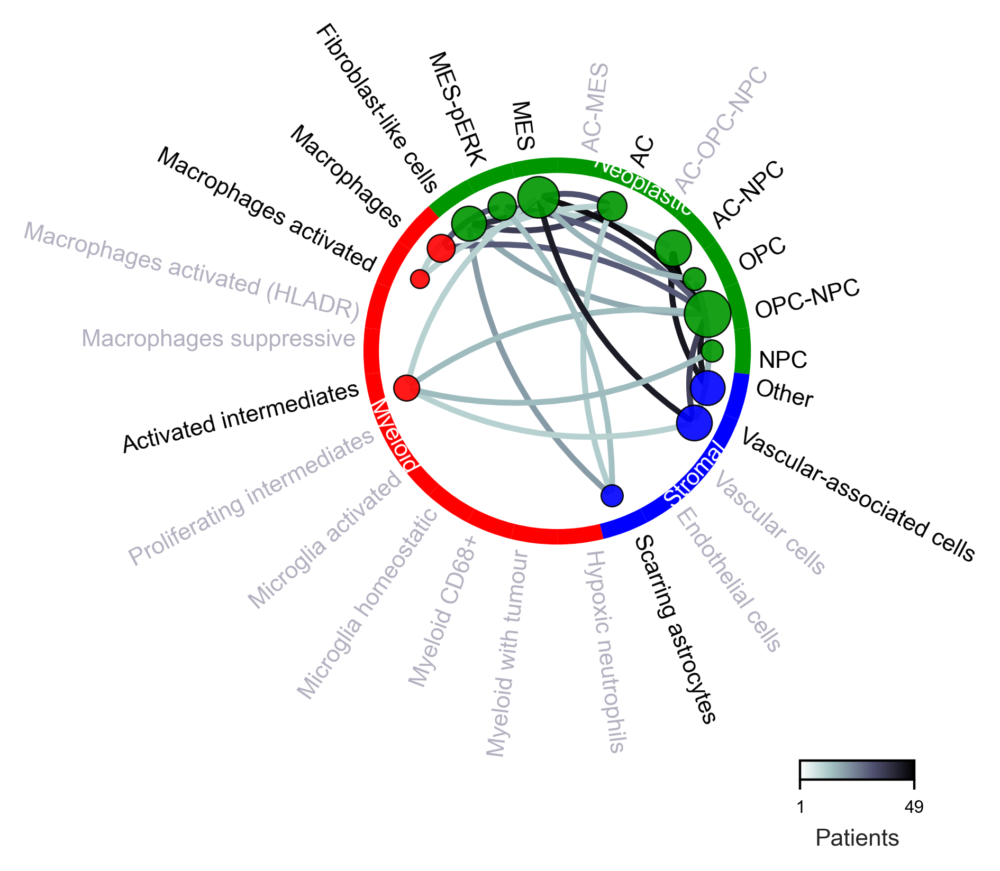

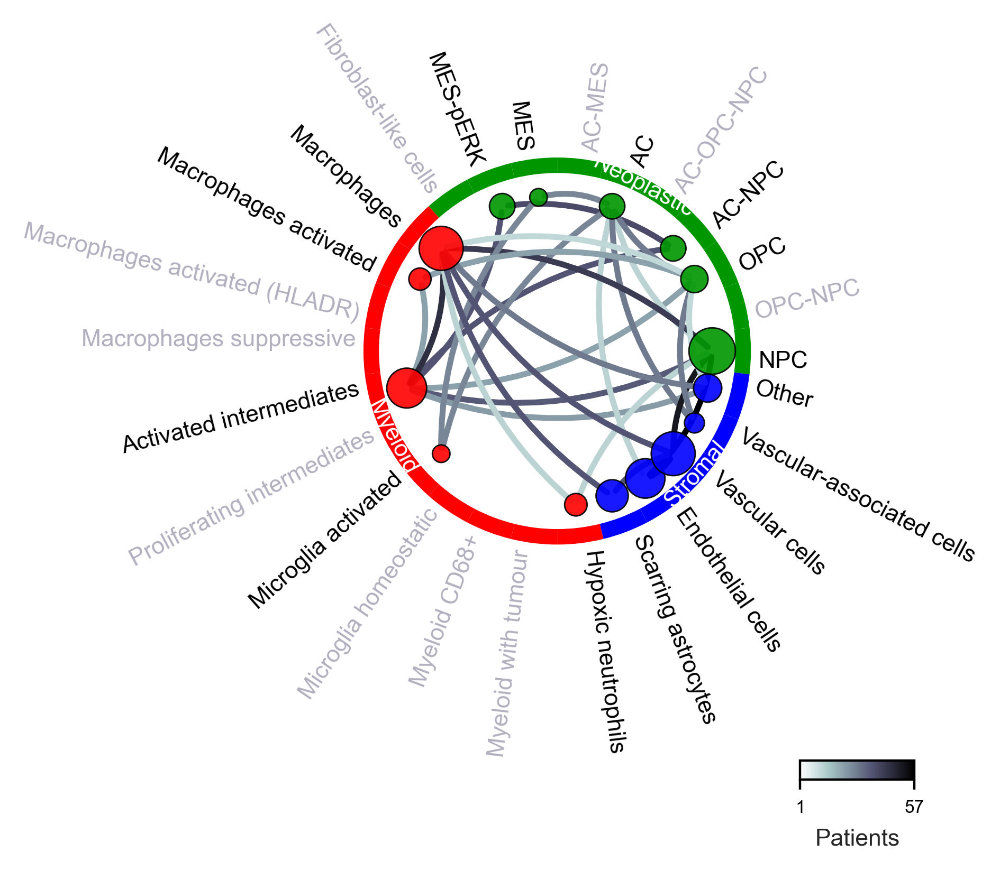

In [25]:
min_patients = 10

#colors_dict = {'Myeloid':'#4DCCBD', 'Neoplastic':'#FF8484', 'Stromal':'#F9DC5C'}
colors_dict = {'Myeloid':'#FF0000', 'Neoplastic':'#009600', 'Stromal':'#0000FF'}

lineage_dict = {'AC': 'Neoplastic',
                 'AC-MES': 'Neoplastic',
                 'AC-NPC': 'Neoplastic',
                 'AC-OPC-NPC': 'Neoplastic',
                 'Activated intermediates': 'Myeloid',
                 'Endothelial cells': 'Stromal',
                 'Fibroblast-like cells': 'Neoplastic',
                 'Hypoxic neutrophils': 'Myeloid',
                 'MES': 'Neoplastic',
                 'MES-pERK': 'Neoplastic',
                 'Macrophages': 'Myeloid',
                 'Macrophages activated': 'Myeloid',
                 'Macrophages activated (HLADR)': 'Myeloid',
                 'Macrophages suppressive': 'Myeloid',
                 'Microglia activated': 'Myeloid',
                 'Microglia homeostatic': 'Myeloid',
                 'Myeloid CD68+': 'Myeloid',
                 'Myeloid with tumour': 'Myeloid',
                 'NPC': 'Neoplastic',
                 'OPC': 'Neoplastic',
                 'OPC-NPC': 'Neoplastic',
                 'Proliferating intermediates': 'Myeloid',
                 'Scarring astrocytes': 'Stromal',
                 'Vascular cells': 'Stromal',
                 'Vascular-associated cells': 'Stromal',
               'Other':'Stromal'}

cell_ordering = ['NPC',
                 'OPC-NPC',                        
                 'OPC',
                 'AC-NPC',                 
                 'AC-OPC-NPC',
                 'AC',
                 'AC-MES',                 
                 'MES',                 
                 'MES-pERK', 
                 'Fibroblast-like cells',      
                 'Macrophages',
                 'Macrophages activated',
                 'Macrophages activated (HLADR)',
                 'Macrophages suppressive',
                 'Activated intermediates',    
                 'Proliferating intermediates',                 
                 'Microglia activated',
                 'Microglia homeostatic',
                 'Myeloid CD68+',
                 'Myeloid with tumour',
                 'Hypoxic neutrophils',
                 'Scarring astrocytes',
                 'Endothelial cells',
                 'Vascular cells',
                 'Vascular-associated cells',
                'Other']

##niche network for patients with short survival, ie logFC > 0
niche_metadata_short = niche_metadata[(niche_metadata['mean_logFC'] > limit) & (niche_metadata['n_patients_niche'] > min_patients)]
G1 = qu.tl.compute_niche_network(niche_df = niche_metadata_short,
                          colors_dict = colors_dict,
                          lineage_dict = lineage_dict,
                          annotation_key = 'quiche_niche_neighborhood')

edges_list = nx.to_pandas_edgelist(G1, nodelist=G1.nodes)
edges_list['Interaction']=edges_list['source']+"___"+edges_list['target']
edges_list['Interaction2']=edges_list['target']+"___"+edges_list['source']
edges_list.to_csv('Figures/QUICHE/donut_edges_short.csv')

qu.pl.plot_niche_network_donut(G = G1,
                               figsize=(4.5, 4.5),
                               fontsize=8,
                               node_order = cell_ordering,
                               centrality_measure = 'eigenvector',
                               colors_dict = colors_dict,
                               lineage_dict=lineage_dict, 
                               donut_radius_inner = 1.15,
                               donut_radius_outer = 1.25,
                               edge_cmap = 'bone_r',
                               edge_label = 'Patients',
                               save_directory='Figures/QUICHE/',
                               filename_save='NetworkDonut_short.svg',
                               min_node_size = 25,
                               max_node_size= 250)

##niche network for patients with long survival, ie logFC < 0
niche_metadata_long = niche_metadata[(niche_metadata['mean_logFC'] < -limit) & (niche_metadata['n_patients_niche'] > min_patients)]
G2 = qu.tl.compute_niche_network(niche_df = niche_metadata_long,
                          colors_dict = colors_dict,
                          lineage_dict = lineage_dict,
                          annotation_key = 'quiche_niche_neighborhood')

edges_list = nx.to_pandas_edgelist(G2, nodelist=G2.nodes)
edges_list['Interaction']=edges_list['source']+"___"+edges_list['target']
edges_list['Interaction2']=edges_list['target']+"___"+edges_list['source']
edges_list.to_csv('Figures/QUICHE/donut_edges_long.csv')


qu.pl.plot_niche_network_donut(G = G2,
                               figsize=(4.5, 4.5),
                               fontsize=8,
                               node_order = cell_ordering,
                               centrality_measure = 'eigenvector',
                               colors_dict = colors_dict,
                               lineage_dict=lineage_dict, 
                               donut_radius_inner = 1.15,
                               donut_radius_outer = 1.25,
                               edge_cmap = 'bone_r',
                               edge_label = 'Patients',
                               save_directory='Figures/QUICHE/',
                               filename_save='NetworkDonut_long.svg',
                               min_node_size = 25,
                               max_node_size= 250)

# <font color=blue>Save for further analysis</font>
This is all new code that is specific for my purposes

### Export to .csv files
The purpose of this was to export for downstream analysis

In [33]:
def classify_quiches(x, niche_metadata_short, niche_metadata_long):
    
    if x in niche_metadata_short.quiche_niche_neighborhood.tolist():
        return 'Short_neigh'
    elif x in niche_metadata_long.quiche_niche_neighborhood.tolist():
        return 'Long_neigh'
    else:
        return 'Neutral_neigh'

# Create a df that just groups into long vs short neighs
quiche_op.mdata['quiche'].var['QUICHE_broad_class'] = [classify_quiches(x, niche_metadata_short, niche_metadata_long) for x in quiche_op.mdata['quiche'].var['quiche_niche_neighborhood'].tolist()]
quiche_broad_df = pd.crosstab(quiche_op.mdata['quiche'].var['Case'], quiche_op.mdata['quiche'].var['QUICHE_broad_class'])
quiche_broad_df.to_csv('QUICHE_csv_outputs/QUICHE_by_case_aggregated.csv')

# ...proportions
quiche_broad_prop_df = pd.crosstab(quiche_op.mdata['quiche'].var['Case'], quiche_op.mdata['quiche'].var['QUICHE_broad_class'], normalize=0)
quiche_broad_prop_df.to_csv('QUICHE_csv_outputs/QUICHE_by_case_aggregated_proportions.csv')

# Breakdown of individual neighs by case
quiche_df = pd.crosstab(quiche_op.mdata['quiche'].var['Case'], quiche_op.mdata['quiche'].var['quiche_niche_neighborhood']).loc[:, niche_scores.index]
quiche_df.to_csv('QUICHE_csv_outputs/QUICHE_by_case.csv')

# ...proportions
quiche_df_prop = pd.crosstab(quiche_op.mdata['quiche'].var['Case'], quiche_op.mdata['quiche'].var['quiche_niche_neighborhood'], normalize=0).loc[:, niche_scores.index]
quiche_df_prop.to_csv('QUICHE_csv_outputs/QUICHE_by_case_proportions.csv')

# Merge and save
quiche_df_merged = quiche_df.merge(quiche_broad_df,left_index=True, right_index=True)
quiche_df_merged.to_csv('QUICHE_csv_outputs/QUICHE_by_case_merged.csv')

niche_scores['Enriched_in']=np.where(niche_scores['logFC']<0, 'Long','Short')
niche_scores.to_csv('QUICHE_csv_outputs/QUICHE_significant.csv')

### Export QUICHE neighbourhoods

In [27]:
quiche_spatial_stats = quiche_op.mdata['quiche'].var.set_index('index_cell', drop=True)[['-log10(SpatialFDR)', 'logFC', 'SpatialFDR']].copy()
quiche_neighdata = quiche_op.mdata['spatial_nhood'].obs[['Master_Index', 'ObjectNumber', 'Case', 'ROI', 'quiche_niche_neighborhood']].copy()
pd.merge(left=quiche_spatial_stats, right=quiche_neighdata, left_index=True, right_index=True).to_csv('QUICHE_obs.csv')

### Plot Niches

In [ ]:
sc.set_figure_params(dpi = 150, dpi_save = 100, fontsize = 8)
adata.obs['quiche_neigh'] = adata.obs.index.map(quiche_op.mdata['quiche'].var.set_index('index_cell').quiche_niche_neighborhood.to_dict())

import matplotlib.pyplot as plt
import seaborn as sb

for roi in adata.obs.ROI.unique().to_list():

    # Create a figure with a black background
    fig, ax = plt.subplots()
    #fig.patch.set_facecolor('black')
    #ax.set_facecolor('black')

    data = adata.obs[adata.obs.ROI == roi].copy()

    data['quiche_neigh'] = np.where(data['quiche_neigh'].isin(niche_scores.index), data['quiche_neigh'], 'None')
    
    quiche_cmap = {x:v for x,v in zip(niche_scores.index.tolist(), sc.plotting.palettes.godsnot_102)}
    quiche_cmap['None']='whitesmoke'
    
    num_cats = len(data['quiche_neigh'].unique())
    
    # Calculate min and max for x and y
    x_min, x_max = data['X_loc'].min(), data['X_loc'].max()
    y_min, y_max = data['Y_loc'].min(), data['Y_loc'].max()

    # Create scatter plot
    sb.scatterplot(data=data, 
                   x='X_loc', 
                   y='Y_loc', 
                   hue='quiche_neigh',
                   palette= quiche_cmap,
                   s=8, 
                   ax=ax,
                   edgecolor=None,  # Black outline for points
                   linewidth=0)      # Thin black border

    # Hide grid
    ax.grid(False)
    #ax.set_facecolor('black')

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    
    ax.set_ylabel('')
    ax.set_xlabel('')

    # Move legend to the right and make it smaller
    ax.legend(loc='center left', 
              bbox_to_anchor=(1, 0.5), 
              fontsize='small',  # Adjust font size ('x-small', 'small', 'medium', 'large', etc.)
              markerscale=2)   # Reduce marker size in the legend

    # Show the plot
    fig.savefig(f'QuicheNeighs/{roi}.png', bbox_inches='tight', dpi=300)

    plt.close()


### Map niche neighborhoods back to FOV for visualization
<font color='red'>This is all adapted from the QUICHE code </font>

In [ ]:
#subset_mdata = quiche_op.mdata['spatial_nhood'][quiche_op.mdata['spatial_nhood'].obs.loc[:, "quiche_niche_neighborhood"] == 'AC__OPC']
niche = 'Endothelial cells__NPC'

# Need to do this to catch an error
quiche_op.mdata['spatial_nhood'].obs.rename(columns={'population_final':'cell_cluster'}, inplace=True)

# Get a list of patients in which this niche was found, and then the ROIs from those patients to plot
patient_list = niche_metadata.loc[niche_metadata.quiche_niche_neighborhood == niche, 'patient_ids'].iloc[0].tolist() + niche_metadata.loc[niche_metadata.quiche_niche_neighborhood == niche, 'patient_ids'].iloc[1].tolist() 
#patient_list = niche_metadata.loc[niche_metadata.quiche_niche_neighborhood == niche, 'patient_ids'].tolist()

patient_rois = quiche_op.mdata['spatial_nhood'].obs[quiche_op.mdata['spatial_nhood'].obs['Case'].isin(patient_list)]['ROI'].unique()

qu.pl.plot_niches(quiche_op, 
                  niche = niche,
                  fovs = patient_rois,
                  segmentation_directory = 'Masks',
                  save_directory = os.path.join('QuicheFigures', 'niches'),
                  fov_key = "ROI",
                  segmentation_label_key  = "ObjectNumber",
                  #labels_key='population_final',
                  annotation_key = "quiche_niche_neighborhood",
                  seg_suffix = ".tif",
                  colors_dict = None,
                  figsize = (6, 6),
                  dpi = 100)

plt.close()

qu.pl.plot_niche_scores(quiche_op, 
                        niche = niche,
                        fovs = patient_rois,
                        segmentation_directory = 'Masks',
                        save_directory = os.path.join('QuicheFigures', 'logFC'),
                        fov_key = "ROI",
                        segmentation_label_key  = "ObjectNumber",
                        #labels_key='cell_cluster',
                        annotation_key = "quiche_niche_neighborhood",
                        metric = "logFC",
                        seg_suffix = ".tif",
                        vmin  = None,
                        vmax = None,
                        cmap = "vlag",
                        figsize = (6, 6),
                        dpi = 100)

plt.close()

plot niche scores (e.g. logFC, -log10(SpatialFDR))

In [ ]:
qu.pl.plot_niche_scores(quiche_op, 
                        niche = niche,
                        fovs = ['TMA44_R14C7'],
                        segmentation_directory = seg_dir,
                        save_directory = os.path.join('figures', 'logFC'),
                        fov_key = "fov",
                        segmentation_label_key  = "label",
                        labels_key='cell_cluster',
                        annotation_key = "quiche_niche_neighborhood",
                        metric = "logFC",
                        seg_suffix = "_whole_cell.tiff",
                        vmin  = None,
                        vmax = None,
                        cmap = "vlag",
                        figsize = (6, 6),
                        dpi = 300)

qu.pl.plot_niche_scores(quiche_op, 
                        niche = niche,
                        fovs = ['TMA44_R14C7'],
                        segmentation_directory = seg_dir,
                        save_directory = os.path.join('figures', '-log10(SpatialFDR)'),
                        fov_key = "fov",
                        segmentation_label_key  = "label",
                        labels_key='cell_cluster',
                        annotation_key = "quiche_niche_neighborhood",
                        metric = "-log10(SpatialFDR)",
                        seg_suffix = "_whole_cell.tiff",
                        vmin  = None,
                        vmax = None,
                        cmap = "Reds",
                        figsize = (6, 6),
                        dpi = 300)

quiche_op.compute_functional_expression### plot differential expression within niches as compared to the entire cohort

In [345]:
functional_markers = adata.var.index.tolist()
quiche_op.compute_functional_expression(niches=niche_scores.index,
                                        annotation_key = 'quiche_niche_neighborhood',
                                        min_cell_threshold = 3,
                                        foldchange_key = 'logFC',
                                        markers = functional_markers,
                                        n_jobs = 8)

Computing Functional Expression:   0%|                                                       | 0/59591 [00:00<?, ?it/s]

  0%|          | 0/59591 [00:00<?, ?it/s]

Computing Functional Expression:   0%|                                                       | 0/59591 [04:18<?, ?it/s]


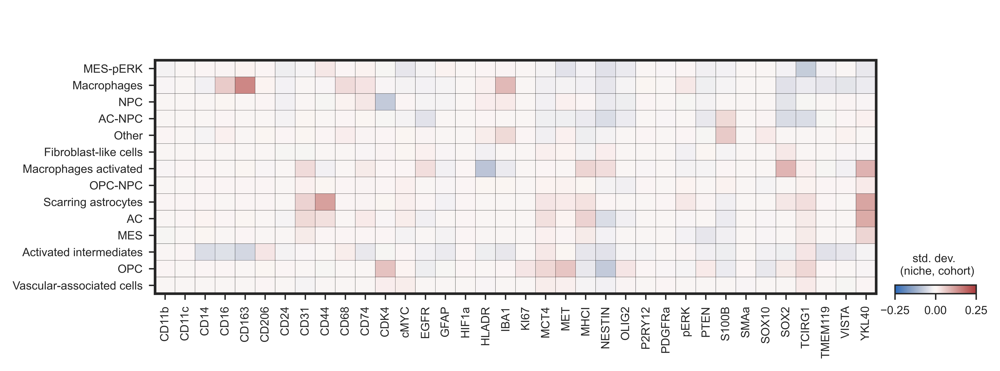

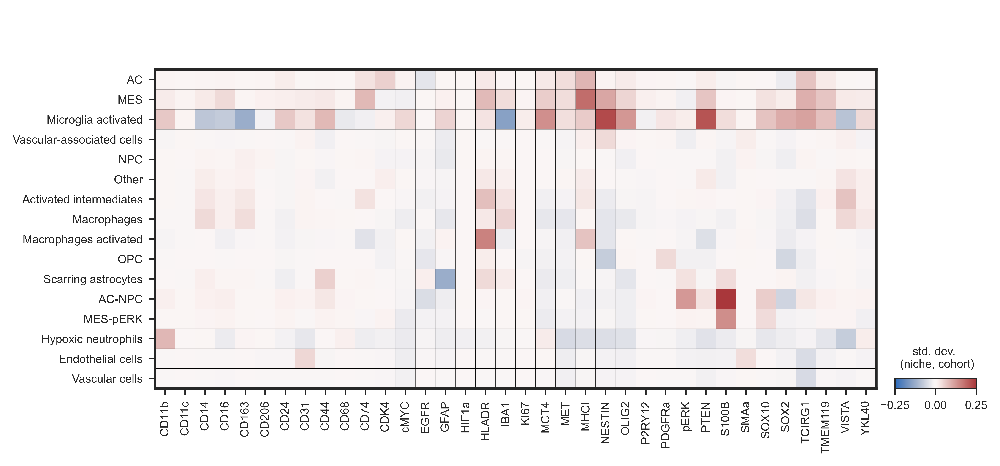

In [346]:
qu.pl.plot_differential_expression(quiche_op,
                            niches = np.unique(niche_metadata_short.quiche_niche_neighborhood), 
                            annotation_key = 'quiche_niche_neighborhood',
                            labels_key = 'cell_cluster',
                            markers = functional_markers,
                            figsize = (8, 3),
                            cmap = 'vlag',
                            vmin = -0.25,
                            vmax = 0.25,
                            vcenter = 0,
                            save_directory = 'Figures/QUICHE',
                            filename_save = 'matrixplot_differential_marker_expression_SHORT.png')

qu.pl.plot_differential_expression(quiche_op,
                            niches = np.unique(niche_metadata_long.quiche_niche_neighborhood), 
                            annotation_key = 'quiche_niche_neighborhood',
                            labels_key = 'cell_cluster',
                            markers = functional_markers,
                            figsize = (8, 3.75),
                            cmap = 'vlag',
                            vmin = -0.25,
                            vmax = 0.25,
                            vcenter = 0,
                            save_directory = 'Figures/QUICHE',
                            filename_save = 'matrixplot_differential_marker_expression_LONG.png')